Total number of classes: 61


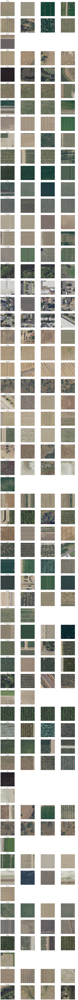


Class distribution:
land_cover
Grapes                     90484
Almonds                    49792
Grassland/Pasture          42771
Fallow/Idle Cropland       18897
Developed/Med Intensity    16955
                           ...  
Sweet Corn                     1
Rice                           1
Rye                            1
Watermelons                    1
Sod/Grass Seed                 1
Name: count, Length: 61, dtype: int64


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
from pathlib import Path
import seaborn as sns
import os

# Set random seed for reproducibility
np.random.seed(42)

ROOT_DIR = Path(os.getcwd()).parent

# Read the metadata
metadata_path = ROOT_DIR / 'data/land_cover_representation/metadata.csv'
df = pd.read_csv(metadata_path)

# Get unique land cover classes
unique_classes = df['land_cover'].unique()
print(f"Total number of classes: {len(unique_classes)}")

# Set up the plotting style
sns.set_palette("husl")

# Function to load and display images
def plot_land_cover_samples(class_name, samples, fig, axes, row):
    class_files = df[df['land_cover'] == class_name]['file_name'].values
    
    # Randomly sample up to 4 images
    selected_files = np.random.choice(class_files, min(len(class_files), samples), replace=False)
    
    for col, file_name in enumerate(selected_files):
        # Load the image
        img_path = ROOT_DIR / 'data/land_cover_representation' / file_name
        img = np.load(img_path)
        img = img[:, :, :3]
        
        # Display the image
        ax = axes[row][col]
        ax.imshow(img)
        ax.axis('off')
        
        # Add title only to the first image in the row
        if col == 0:
            ax.set_title(f"{class_name}\n({len(class_files)} total)", fontsize=8, pad=5)
        
    # Turn off any remaining empty axes in the row
    for col in range(len(selected_files), samples):
        axes[row][col].axis('off')

# Create a figure to display the samples
samples_per_class = 4
fig, axes = plt.subplots(len(unique_classes), samples_per_class, 
                        figsize=(15, 3*len(unique_classes)))

# Plot samples for each class
for i, class_name in enumerate(sorted(unique_classes)):
    plot_land_cover_samples(class_name, samples_per_class, fig, axes, i)

# Adjust the layout and display
plt.tight_layout()
plt.show()